# Rearranging the dataset

The dataset is wildly imbalanced towards `background` class. Let's force the model to learn on other classes by picking them into the dataset.

# Setup

In [128]:
import os
import json
import numpy as np
import shutil
import patchify
from matplotlib import pyplot as plt
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [150]:
label_dir = './labels/rearrange-test/SegmentationClass'
target_dir = './labels/rearrange-test/targets'
labels = [filename for filename in os.listdir(label_dir) if '.png' in filename]

labels_to_targets = []
with open('./labels-to-targets-map.json') as lttmjson:
    labels_to_targets = json.load(lttmjson)
    
img_height, img_width, img_channels = np.asarray(Image.open(f'{label_dir}/{labels[0]}')).shape
patch_size = 480
patches_in_row = img_width // patch_size
patches_in_column = img_height // patch_size
patches_in_image = patches_in_row * patches_in_column
zfill_digits = len(str(patches_in_column * patches_in_row))
(patches_in_row, patches_in_column)

(12, 6)

In [130]:
img_width

5760

# Get target files for testing

In [4]:
targets = [labels_to_targets[labelname]["image"] for labelname in labels]
targets_orig = ''
for target in targets:
    shutil.copy2(f'./data_360/images/{target}', f'./labels/rearrange-test/targets/{target}')

# Look at example segmentations

In [5]:
labels_iter = iter(labels)

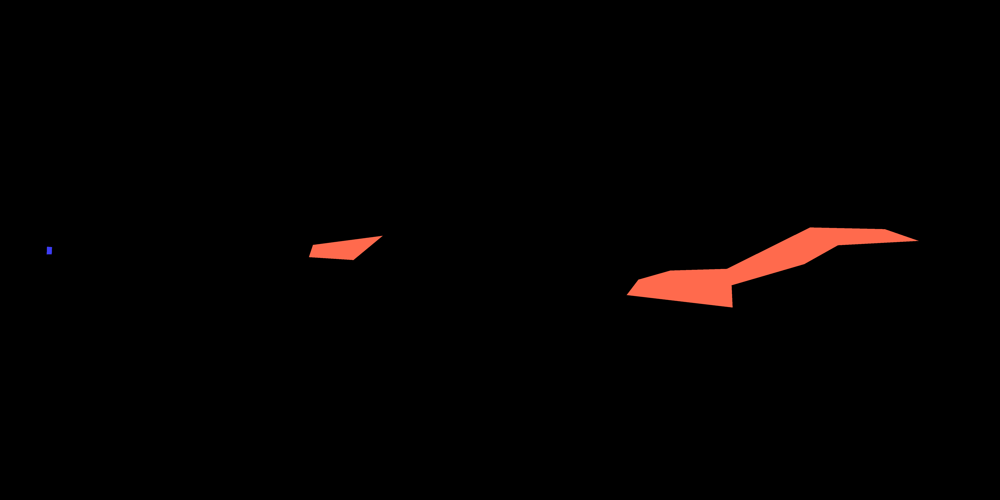

In [6]:
Image.open(f'{label_dir}/{next(labels_iter)}')

# Generate label, target pairs

First, let's build and test the pipeline

In [131]:
def get_label_target_pair(label_filename, label_dir, target_dir):
    with open('./labels-to-targets-map.json') as lttfile:
        labels_to_targets = json.load(lttfile)
        label_path = f'{label_dir}/{label_filename}'
        target_path = f'{target_dir}/{labels_to_targets[label_filename]["image"]}'
        x = Image.open(target_path)
        y = Image.open(label_path)
        return (x, y)

In [132]:
x, y = get_label_target_pair(next(labels_iter), label_dir, target_dir)

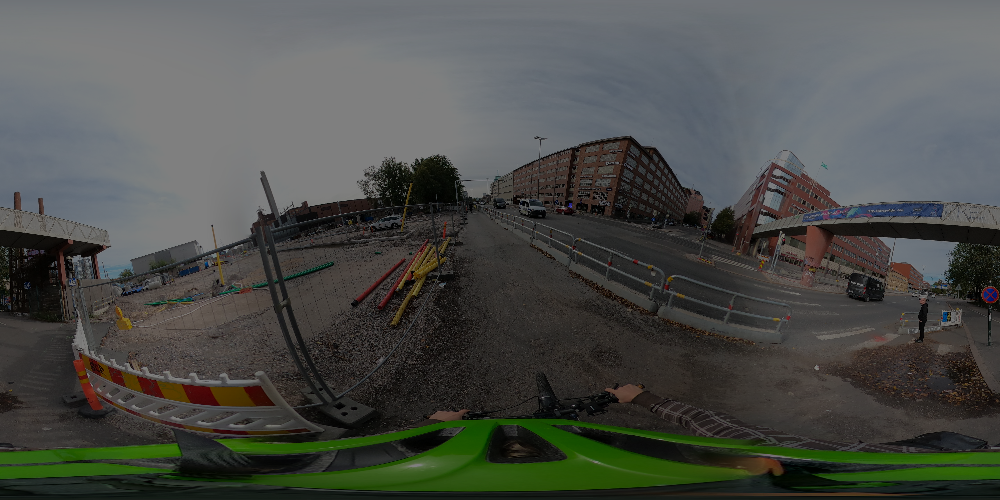

In [133]:
Image.blend(x, y, 0.5)

In [134]:
y_patched = patchify.patchify(np.asarray(y), (patch_size, patch_size, 3), step=patch_size).reshape(patches_in_column, patches_in_row, patch_size, patch_size, 3)
x_patched = patchify.patchify(np.asarray(x), (patch_size, patch_size, 3), step=patch_size).reshape(patches_in_column, patches_in_row, patch_size, patch_size, 3)

In [135]:
def get_labels_and_targets(y_patched, x_patched, patch_size):
    ok_labels = np.zeros((0, patch_size, patch_size, 3))
    ok_targets = np.zeros((0, patch_size, patch_size, 3))
    for i in range(0, y_patched.shape[0]):
        for j in range(0, y_patched.shape[1]):
            if not (np.all(y_patched[i][j] == [0, 0, 0])):
                ok_labels = np.concatenate((ok_labels, np.asarray([y_patched[i][j]])), axis=0)
                ok_targets = np.concatenate((ok_targets, np.asarray([x_patched[i][j]])), axis=0)
    return(ok_targets, ok_labels)

TypeError: 'AxesSubplot' object is not subscriptable

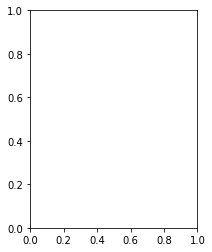

In [136]:
ok_targets, ok_labels = get_labels_and_targets(y_patched, x_patched, patch_size)

fig, axs = plt.subplots(1, len(ok_labels), figsize=(3*len(ok_labels), 4))
for i in range(0, len(ok_labels)):
    label = ok_labels[i] / 255 * 0.34
    target = ok_targets[i] / 255 * 0.66
    img = label + target
    axs[i].imshow(img)

2

In [265]:
def println(value):
    print(value, end="")
    print('\r', end="")

def get_only_class_examples(labels, labels_to_targets_map, labels_folderpath, targets_folderpath, labels_outfolder, targets_outfolder, patch_size, patches_in_column, patches_in_row):
    total = len(labels)
    done = 0
    println(f'Done: 0/{total}')
    for i, label in enumerate(labels):
        x, y = get_label_target_pair(label, labels_folderpath, targets_folderpath)
        x_patched = patchify.patchify(np.asarray(x), (patch_size, patch_size, 3), step=patch_size).reshape(patches_in_column, patches_in_row, patch_size, patch_size, 3)
        y_patched = patchify.patchify(np.asarray(y), (patch_size, patch_size, 3), step=patch_size).reshape(patches_in_column, patches_in_row, patch_size, patch_size, 3)
        x_relevants, y_relevants = get_labels_and_targets(y_patched, x_patched, patch_size)
        for j in range(0, x_relevants.shape[0]):
            out_name = label.replace('.png', '') 
            np.savez_compressed(f'{targets_outfolder}/{out_name}-{str(j).zfill(zfill_digits)}.npz', x_relevants[j])
            np.savez_compressed(f'{labels_outfolder}/{out_name}-{str(j).zfill(zfill_digits)}.npz', y_relevants[j])
        println(f'Done: {i+1}/{total}')

# OK, now do it for reals

In [266]:
labels_dir_real = './labels/2021-12-18/SegmentationClass'
target_dir_real = './data_360/images'
labels_outdir = './labels/2021-12-27/SegmentationClass'
target_outdir = './targets/2021-12-27'
labels_real = [label for label in os.listdir(labels_dir_real) if label[-4:] == '.png']

In [267]:
get_only_class_examples(
    labels=labels_real,
    labels_to_targets_map=labels_to_targets,
    labels_folderpath=labels_dir_real,
    targets_folderpath=target_dir_real,
    labels_outfolder=labels_outdir,
    targets_outfolder=target_outdir,
    patch_size=patch_size,
    patches_in_column=patches_in_column,
    patches_in_row=patches_in_row
)

# Make sure stuff worked

In [181]:
new_labelsdir = './labels/rearrange-test/new-labels'
new_targetsdir = './labels/rearrange-test/new-targets'

labels_npy = iter([label for label in os.listdir(labels_outdir) if '.npz' in label])


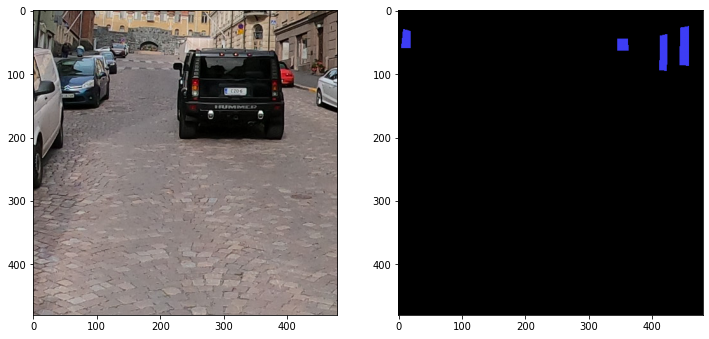

In [264]:
nextval = next(labels_npy)
y = np.load(f'{labels_outdir}/{nextval}')['arr_0']
x = np.load(f'{target_outdir}/{nextval}')['arr_0']

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
x_draw = x / 255
y_draw = y / 255
axs[0].imshow(x_draw)
axs[1].imshow(y_draw)